# Practical Bioinformatics / Homework 3 - BLAST

## Task 1

Using the BLAST program let's find at the Swiss-Prot protein sequence data bank the two proteins with the sequences that are most similar to our. If BLAST finds more than one alignment with the same protein, we need to note this and characterize both identified alignments.

My protein is P21399 (its accession number).

In [ ]:
!pip install biopython

     |████████████████████████████████| 2.3 MB 4.4 MB/s 


In [ ]:
from Bio import ExPASy
from Bio import SeqIO

with ExPASy.get_sprot_raw("P21399") as handle:
    seq_record = SeqIO.read(handle, "swiss")
print(seq_record.id)
print(seq_record.name)
print(seq_record.description)
print("Length %i" % len(seq_record))

P21399
ACOHC_HUMAN
RecName: Full=Cytoplasmic aconitate hydratase {ECO:0000305|PubMed:1946430}; Short=Aconitase; EC=4.2.1.3 {ECO:0000269|PubMed:1281544, ECO:0000269|PubMed:1946430, ECO:0000269|PubMed:8041788}; AltName: Full=Citrate hydro-lyase; AltName: Full=Ferritin repressor protein; AltName: Full=Iron regulatory protein 1; Short=IRP1; AltName: Full=Iron-responsive element-binding protein 1; Short=IRE-BP 1;
Length 889


In [ ]:
print(seq_record.seq)

MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIEVPFKPARVILQDFTGVPAVVDFAAMRDAVKKLGGDPEKINPVCPADLVIDHSIQVDFNRRADSLQKNQDLEFERNRERFEFLKWGSQAFHNMRIIPPGSGIIHQVNLEYLARVVFDQDGYYYPDSLVGTDSHTTMIDGLGILGWGVGGIEAEAVMLGQPISMVLPQVIGYRLMGKPHPLVTSTDIVLTITKHLRQVGVVGKFVEFFGPGVAQLSIADRATIANMCPEYGATAAFFPVDEVSITYLVQTGRDEEKLKYIKKYLQAVGMFRDFNDPSQDPDFTQVVELDLKTVVPCCSGPKRPQDKVAVSDMKKDFESCLGAKQGFKGFQVAPEHHNDHKTFIYDNTEFTLAHGSVVIAAITSCTNTSNPSVMLGAGLLAKKAVDAGLNVMPYIKTSLSPGSGVVTYYLQESGVMPYLSQLGFDVVGYGCMTCIGNSGPLPEPVVEAITQGDLVAVGVLSGNRNFEGRVHPNTRANYLASPPLVIAYAIAGTIRIDFEKEPLGVNAKGQQVFLKDIWPTRDEIQAVERQYVIPGMFKEVYQKIETVNESWNALATPSDKLFFWNSKSTYIKSPPFFENLTLDLQPPKSIVDAYVLLNLGDSVTTDHISPAGNIARNSPAARYLTNRGLTPREFNSYGSRRGNDAVMARGTFANIRLLNRFLNKQAPQTIHLPSGEILDVFDAAERYQQAGLPLIVLAGKEYGAGSSRDWAAKGPFLLGIKAVLAESYERIHRSNLVGMGVIPLEYLPGENADALGLTGQERYTIIIPENLKPQMKVQVKLDTGKTFQAVMRFDTDVELTYFLNGGILNYMIRKMAK


In [ ]:
from Bio.Blast import NCBIWWW

result = NCBIWWW.qblast("blastp", "swissprot", seq_record.seq, word_size=6)

# save the results in a file
with open("blast_result.xml","w+") as save_to:
  save_to.write(result.read())
  result.close()

In [ ]:
from Bio.Blast import NCBIXML
result = open("blast_result.xml","r")
blast_record = NCBIXML.read(result)
ct = 0
for alignment in blast_record.alignments:
  for hsp in alignment.hsps:
    ct += 1
    print("Alignment", ct)
    print("sequence",alignment.title)
    print("length",alignment.length)
    print("E value",hsp.expect) # the BLAST E-value is the number of expected hits of similar quality (score) that could be found just by chance.
    # For instance, E-value of 10 means that up to 10 hits can be expected to be found just by chance, given the same size of a random database.
    print(hsp.query[0:75] + "...")
    print(hsp.match[0:75] + "...")
    print(hsp.sbjct[0:75] + "...")

print("\n" + "There are" ,ct,"sequences in the BLAST output.")

Alignment 1
sequence sp|P21399.3| RecName: Full=Cytoplasmic aconitate hydratase; Short=Aconitase; AltName: Full=Citrate hydro-lyase; AltName: Full=Ferritin repressor protein; AltName: Full=Iron regulatory protein 1; Short=IRP1; AltName: Full=Iron-responsive element-binding protein 1; Short=IRE-BP 1 [Homo sapiens]
length 889
E value 0.0
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
Alignment 2
sequence sp|Q0VCU1.1| RecName: Full=Cytoplasmic aconitate hydratase; Short=Aconitase; AltName: Full=Citrate hydro-lyase; AltName: Full=Iron-responsive element-binding protein 1; Short=IRE-BP 1 [Bos taurus]
length 889
E value 0.0
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHL EPLDP QPGKKFFNLNKLEDSRYG LPFSIRVLLEAAIRNCD+FLVKK D+ENIL+W V QHKNIE...
MSNPFAHLVEPLDPAQPGKKFFNLNK

We found more than one seq, so, let's select the first two sequences and descibe them.

In [ ]:
ct = 0
accession_numbers = []
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment", ct)
  print("The AC of the sequence is", alignment.accession)
  accession_numbers.append(alignment.accession)

Alignment 1
The AC of the sequence is P21399
Alignment 2
The AC of the sequence is Q0VCU1



First sequence:
- ID (Entry name) and AC (accession number): ACOHC_HUMAN (ID), P21399 (AC).

Second sequence:
- ID (Entry name) and AC (accession number): ACOHC_BOVIN (ID), Q0VCU1 (AC).

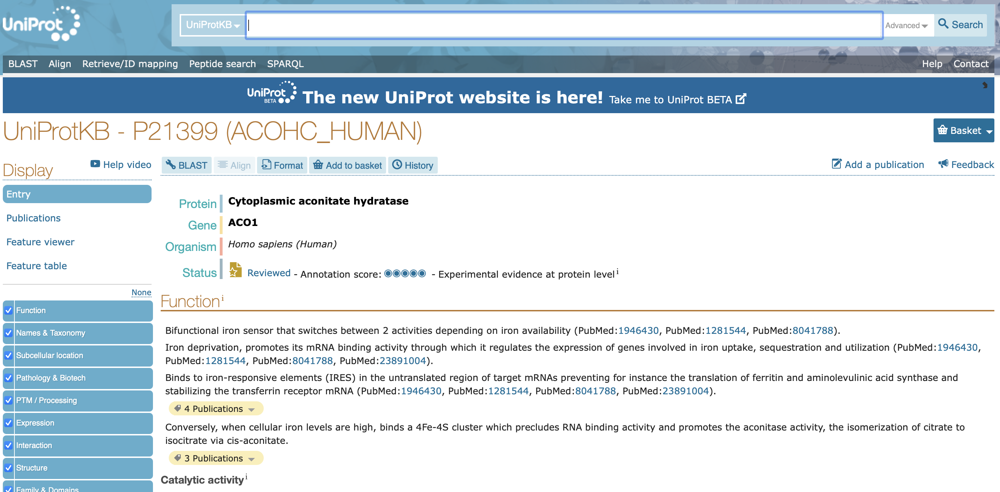

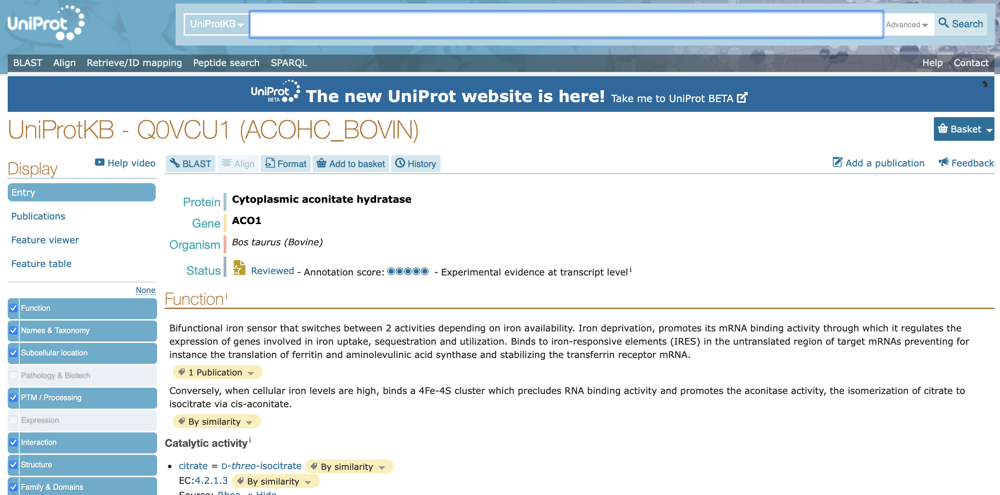


First sequence:
- Organism whom does this protein belong to: Human.


Second sequence:
- Organism whom does this protein belong to: Bovin.

In [ ]:
ct = 0
hsp_identities_percentages = []
hsp_positives_percentages = []
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  hsp_identities_percentages.append(hsp.identities/alignment.length*100)
  hsp_positives_percentages.append(hsp.positives/alignment.length*100)

print(hsp_identities_percentages)
print(hsp_positives_percentages)

[40.26996625421822, 40.26996625421822]
[58.38020247469067, 58.38020247469067]



First sequence:
- Percents of identical and similar (Positives) (positive identical) residues: 40.27% and 58.38%.

Second sequence:
- Percents of identical and similar (Positives) (positive identical) residues: 40.27% and 58.38%.

ps: „Positives‟ correspond to the number of amino acids that are either identical between the query and the subject sequence or have similar chemical properties.

In [ ]:
ct = 0
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment", ct)
  print("length",alignment.length)

Alignment 1
length 889
Alignment 2
length 889


First sequence:
- Length: 889 aa.

Second sequence:
- Length: 889 aa.

In [ ]:
ct = 0
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment", ct)
  print("Number of gaps", hsp.gaps)

Alignment 1
Number of gaps 51
Alignment 2
Number of gaps 51


First sequence:
- Num. of gaps: 51.

Second sequence:
- Num. of gaps: 51.

In [ ]:
ct = 0
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment", ct)
  print("Number of gaps", hsp.gaps)
  print("Score", hsp.score)
  print("Bit score", hsp.bits)

Alignment 1
Number of gaps 51
Score 1732.0
Bit score 671.774
Alignment 2
Number of gaps 51
Score 1732.0
Bit score 671.774


First sequence:
- Score, bit score: 1732.0, 671.774.

Second sequence:
- Score, bit score: 1732.0, 671.774.

A bit score is another prominent statistical indicator used in addition to the Evalue in a BLAST output. The bit score measures sequence similarity independent of query sequence length and database size and is normalized based on the raw pairwise alignment score. 

In [ ]:
for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment",ct)
  print("E value",hsp.expect)

Alignment 3
E value 0.0
Alignment 4
E value 0.0


First sequence:
- E-value: 0.0.

Second sequence:
- E-value: 0.0.

Query coverage: the % of the contig length that aligns with the NCBI hit. A small query coverage % means only a tiny portion of the contig is aligning.

A contig (from the word "contiguous") is a series of overlapping DNA sequences used to make a physical map that reconstructs the original DNA sequence of a chromosome or a region of a chromosome.

In [ ]:
# query coverage = (query_end - query_start) / query_length
ct = 0
query_coverage = []
query_length = blast_record.query_length

for i, alignment in enumerate(blast_record.alignments):
  if i==2: break
  ct +=1
  print("Alignment",ct)
  print("Coverage", round(100*float(hsp.query_end - hsp.query_start)/query_length,0))

Alignment 1
Coverage 96.0
Alignment 2
Coverage 96.0


First sequence:
- Query coverage: 96.0.

Second sequence:
- Query coverage: 96.0.

- How many findings exist: 54.

In [ ]:
ct = 0
for alignment in blast_record.alignments:
  for hsp in alignment.hsps:
    ct += 1

print("\n" + "There are" ,ct,"sequences in the BLAST output.")


There are 54 sequences in the BLAST output.


- How many findings (w/ E value < 0.001) exist: 54.

In [ ]:
E_VALUE_THRESH = 0.001
ct = 0
for alignment in blast_record.alignments:
  for hsp in alignment.hsps:
    if hsp.expect < E_VALUE_THRESH:
      ct += 1
    
print("\n" + "There are" ,ct,"sequences in the BLAST output.")


There are 54 sequences in the BLAST output.


- What is the maximal E value?: 0.0

- What is a criteria for limitation of the results list? (E-value threshhold or max num of findings). If it is max num of findings, we need to decrease the num of findinds according to the given max num of findings). Then, we need to describe an obtained max E value: the main criteria here is E-value threshold (not max num of findings).

Moreover, it is worth to note add the BLAST searching result (a website usage).

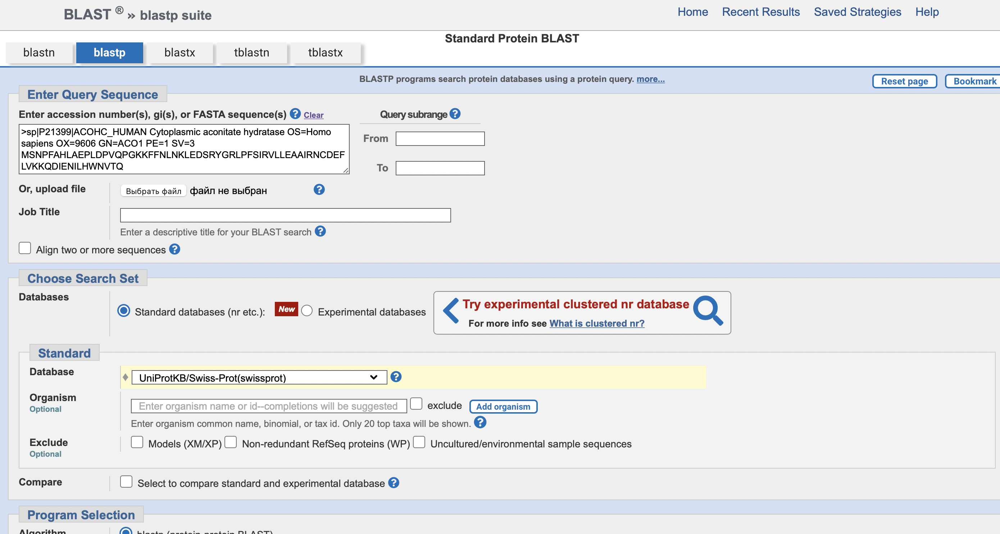

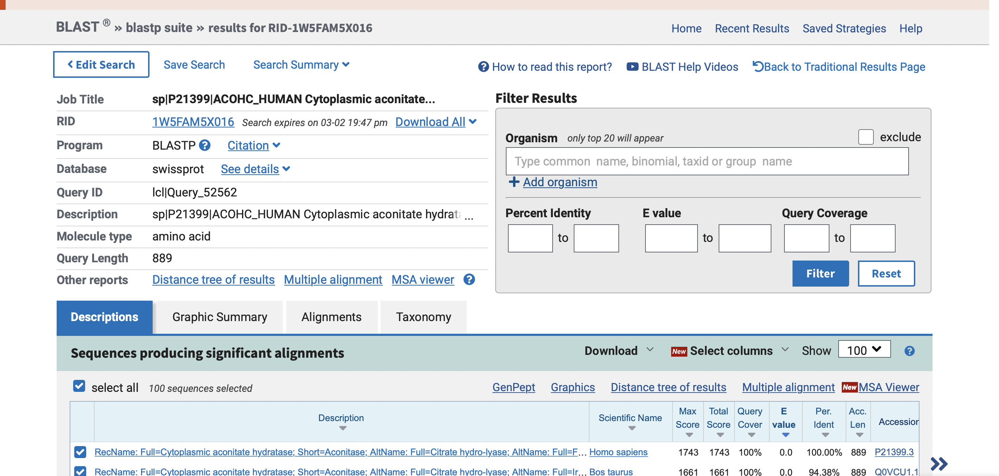

- How many findings exist: 100.

- How many findings (w/ E value < 0.001) exist: 100.

- What is the maximal E value?: 1e-11.

- What is a criteria for limitation of the results list? (E-value threshhold or max num of findings). If it is max num of findings, we need to decrease the num of findinds according to the given max num of findings). Then, we need to describe an obtained max E value: the main criteria here is max num of findings (100); so, let's reduce it to the max size "50" (in this case, max E value = 0.0).

## Task 2

Let's repeat the several steps from the previous task (Task 1) but with changing num of words ([default] (6) to 2).

In [ ]:
from Bio.Blast import NCBIWWW

result2 = NCBIWWW.qblast("blastp", "swissprot", seq_record.seq, word_size=2)

# save the results in a file
with open("blast_result2.xml","w+") as save_to:
  save_to.write(result2.read())
  result2.close()

In [ ]:
from Bio.Blast import NCBIXML
result2 = open("blast_result2.xml","r")
blast_record2 = NCBIXML.read(result2)
ct = 0
for alignment in blast_record2.alignments:
  for hsp in alignment.hsps:
    ct += 1
    print("Alignment", ct)
    print("sequence",alignment.title)
    print("length",alignment.length)
    print("E value",hsp.expect)
    print(hsp.query[0:75] + "...")
    print(hsp.match[0:75] + "...")
    print(hsp.sbjct[0:75] + "...")

print("\n" + "There are" ,ct,"sequences in the BLAST output.")

Alignment 1
sequence sp|P21399.3| RecName: Full=Cytoplasmic aconitate hydratase; Short=Aconitase; AltName: Full=Citrate hydro-lyase; AltName: Full=Ferritin repressor protein; AltName: Full=Iron regulatory protein 1; Short=IRP1; AltName: Full=Iron-responsive element-binding protein 1; Short=IRE-BP 1 [Homo sapiens]
length 889
E value 0.0
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
Alignment 2
sequence sp|Q0VCU1.1| RecName: Full=Cytoplasmic aconitate hydratase; Short=Aconitase; AltName: Full=Citrate hydro-lyase; AltName: Full=Iron-responsive element-binding protein 1; Short=IRE-BP 1 [Bos taurus]
length 889
E value 0.0
MSNPFAHLAEPLDPVQPGKKFFNLNKLEDSRYGRLPFSIRVLLEAAIRNCDEFLVKKQDIENILHWNVTQHKNIE...
MSNPFAHL EPLDP QPGKKFFNLNKLEDSRYG LPFSIRVLLEAAIRNCD+FLVKK D+ENIL+W V QHKNIE...
MSNPFAHLVEPLDPAQPGKKFFNLNK

- How many findings exist: 54.

- How many findings (w/ E value < 0.001) exist: 54.

- What is the maximal E value?: 0.0.

And by use of BLAST website:

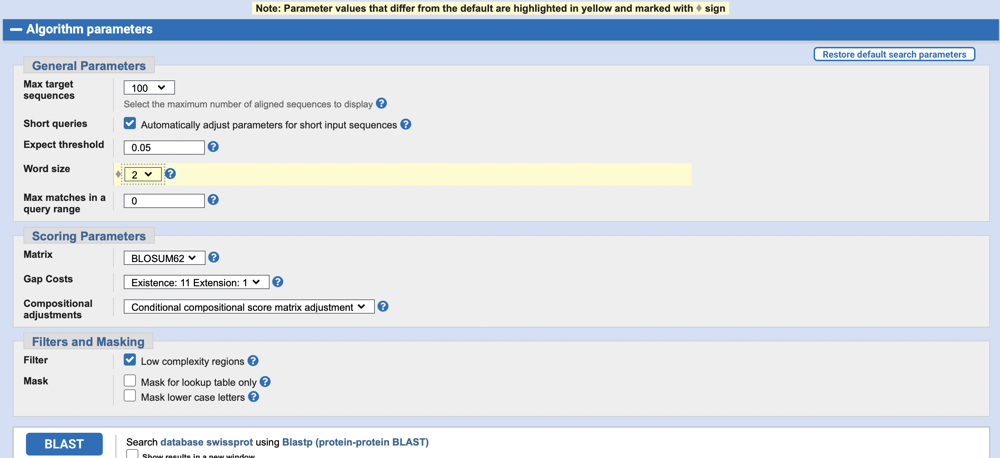

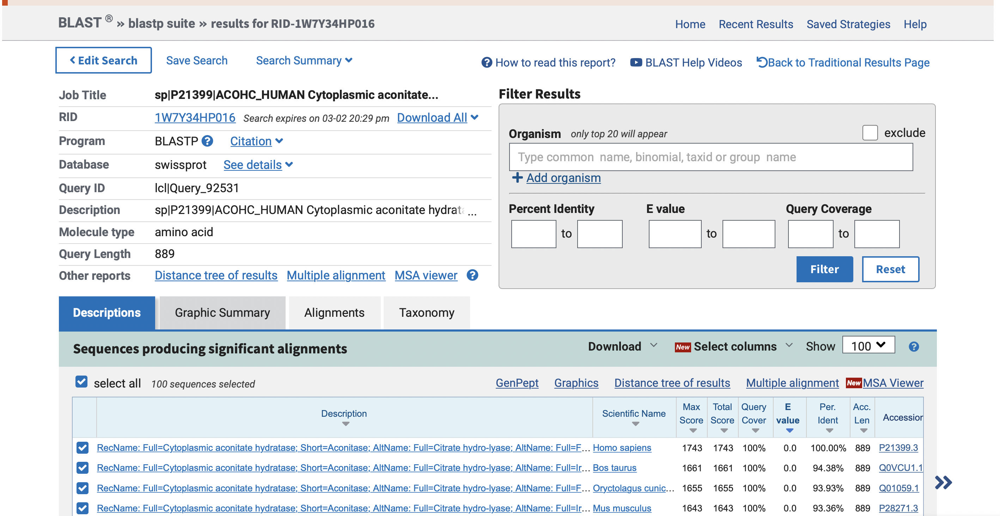

- How many findings exist: 100.

- How many findings (w/ E value < 0.001) exist: 100.

- What is the maximal E value?: 2e-12.

For the next task let's take one of the findings of the previous search with a good enough (< 0.001) but non-zero E-value: I selected E val = 7e-13 (its Score = 184 and Bit score (max score column) = 75.5) (its sequence ID on the image below - A1K4A1.1).

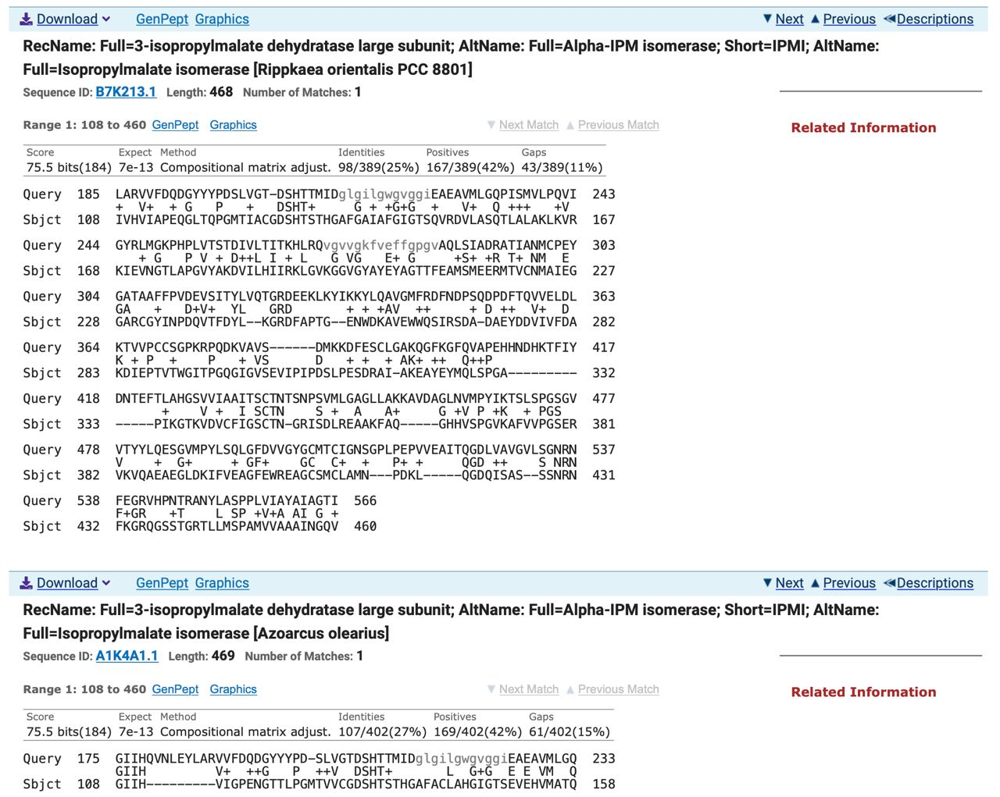

Then we need to go to the corresponding Swiss-Prot entry and find the taxonomy of the organism from which the protein is taken (it is needed to choose one of the "high" enough taxa (but not the highest one, it is better to select the second one from the top)):

https://www.uniprot.org

The chosen protein belongs to Azoarcus olearius.

There are seven main taxonomic ranks: kingdom, phylum or division, class, order, family, genus, species. Let's specify the phylum of Azoarcus olearius - Phylum: Proteobacteria (it can be identified by swiss-prot data bank (for "A1K4A1").

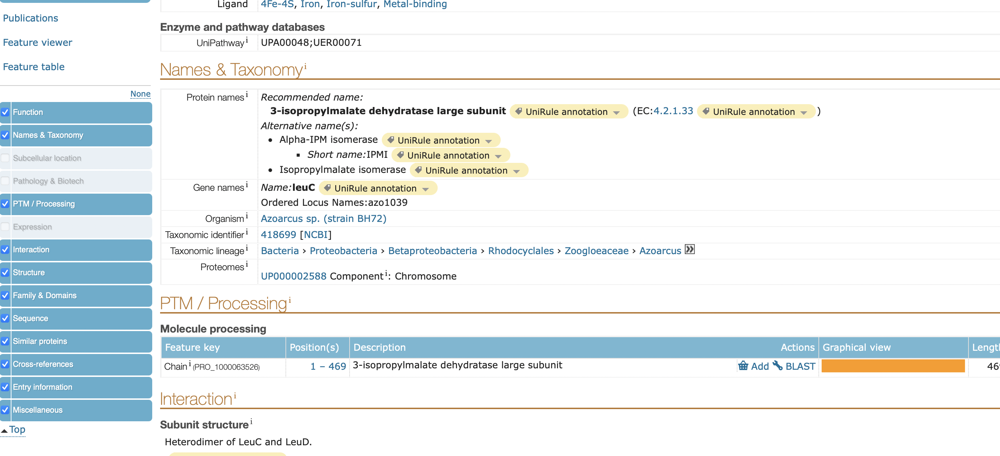

## Task 3

Repeat the previous search steps with specification of it to the selected taxon (same bank (Swiss-Prot) and leave the word length that is equal to 2).

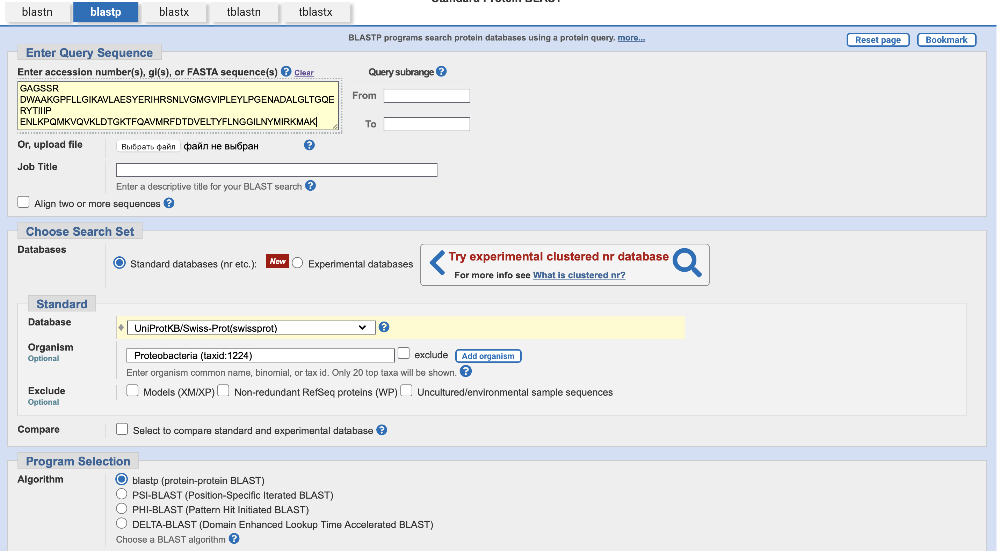

Find again the selected previous finding and compare its E-value and Score from this search with the E-value and Score from the previous search:

from the previous search (AC - A1K4A1.1) - E val = 7e-13, its Score = 184 and Bit score = 75.5;

from this search - E val = 2e-13. its Score = 184 and Bit score = 75.1.

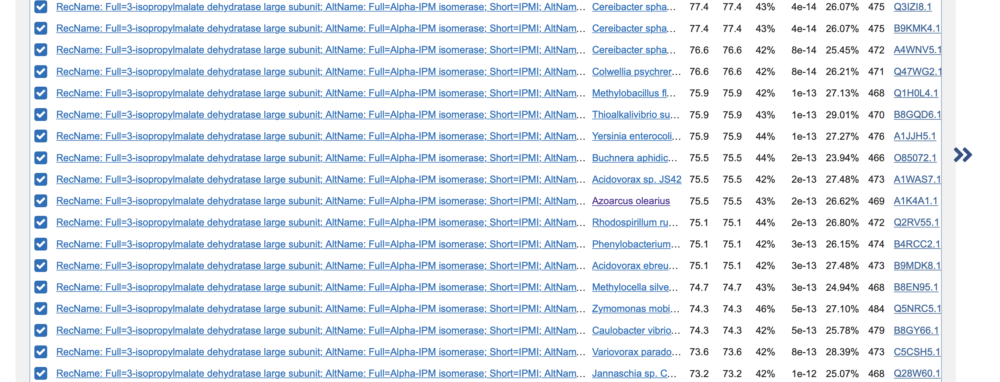

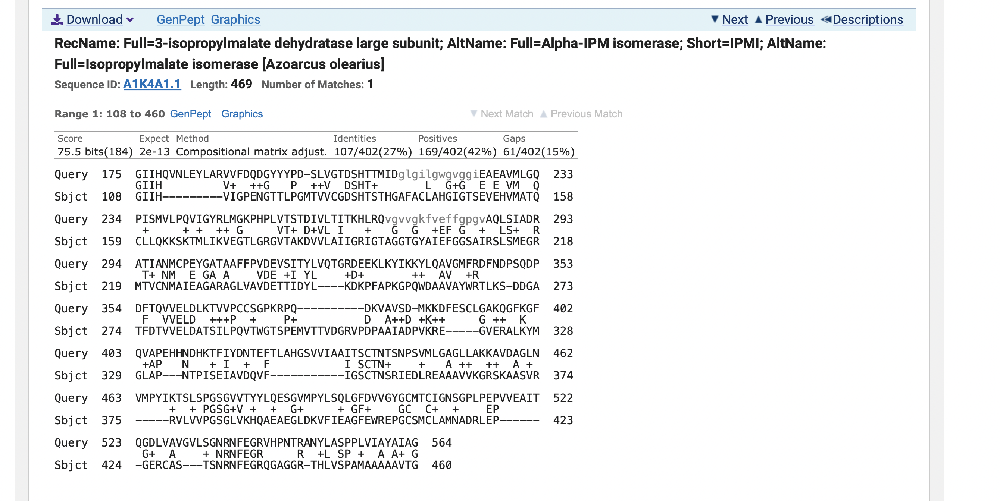

After that, infer the number of protein sequences from a given taxon in the Swiss-Prot bank: 198,801.

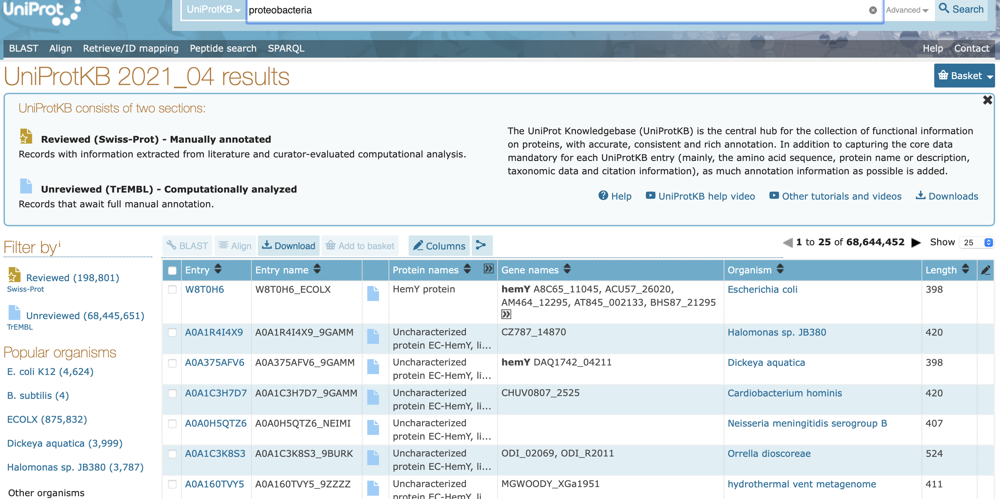

Can Score or Bit-score change due to the alterations in a search volume?: 

Score is not affected by a search volume (because raw score is computed (=> depends on) from a count of matching letters with a scoring matrix and gap penalty).

Bit-score does not depend on database size (cause bit-score is a normalized score). The bit-score gives the same value for hits in databases of different sizes and hence can be used for searching in an constantly increasing database.